<a href="https://colab.research.google.com/github/rahiakela/tensorflow-computer-vision-cookbook/blob/main/09-localizing-elements-in-images-with-object-detection/04_detecting_objects_using_tfhub.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Detecting objects using TFHub

TFHub is a cornucopia of state-of-the-art models when it comes to object detection.
As we'll discover in this recipe, using them to spot elements of interest in our images is
a fairly straightforward task, especially considering they've been trained on the gigantic
COCO dataset, which make them an excellent choice for out-of-the-box object detection.

##Setup

Alternatavly, we can install object-detection-api.

https://stackoverflow.com/questions/50113683/modulenotfounderror-no-module-named-object-detection

In [ ]:
!pip install tensorflow-object-detection-api

In [ ]:
%%shell

wget -q https://github.com/PacktPublishing/Tensorflow-2.0-Computer-Vision-Cookbook/raw/master/ch9/recipe4/test_images/cafe.jpg
wget -q https://github.com/PacktPublishing/Tensorflow-2.0-Computer-Vision-Cookbook/raw/master/ch9/recipe4/test_images/cars.jpg
wget -q https://github.com/PacktPublishing/Tensorflow-2.0-Computer-Vision-Cookbook/raw/master/ch9/recipe4/test_images/dog.jpg
wget -q https://github.com/PacktPublishing/Tensorflow-2.0-Computer-Vision-Cookbook/raw/master/ch9/recipe4/test_images/elephants.jpg
wget -q https://github.com/PacktPublishing/Tensorflow-2.0-Computer-Vision-Cookbook/raw/master/ch9/recipe4/test_images/me_dogs.jpg

mkdir test_images
mv *.jpg test_images/

In [8]:
%%shell

wget -q https://github.com/PacktPublishing/Tensorflow-2.0-Computer-Vision-Cookbook/raw/master/ch9/recipe4/resources/mscoco_label_map.pbtxt
mkdir resources
mv mscoco_label_map.pbtxt resources/

In [1]:
import glob
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
from PIL import Image
from object_detection.utils import visualization_utils as viz
from object_detection.utils.label_map_util import create_category_index_from_labelmap

## Define some helper function

Step-1 : Define a function to load an image into a NumPy array.

In [2]:
def load_image(path):
  image_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(image_data))

  width, height = image.size
  shape = (1, height, width, 3)

  image = np.array(image.getdata())
  image = image.reshape(shape).astype('uint8')

  return image

Step-2 : Define a function to make predictions with a model, and save the results to disk.

In [3]:
def get_and_save_predictions(model, image_path):
  # Start by loading the image and passing it through the model
  image = load_image(image_path)
  results = model(image)

  # Convert the results to NumPy arrays
  model_output = {k: v.numpy() for k, v in results.items()}

  # Create a visualization of the detections with their boxes, scores, and classes
  boxes = model_output['detection_boxes'][0]
  classes = model_output['detection_classes'][0].astype('int')
  scores = model_output['detection_scores'][0]

  clone = image.copy()
  viz.visualize_boxes_and_labels_on_image_array(
      image=clone[0],
      boxes=boxes,
      classes=classes,
      scores=scores,
      category_index=CATEGORY_IDX,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.30,
      agnostic_mode=False,
      line_thickness=5
  )

  # Save the result to disk
  plt.figure(figsize=(24, 32))
  plt.imshow(clone[0])

  plt.savefig(f'output/{image_path.split("/")[-1]}')

## Load TFHub model

Step-3: Load COCO's category index:

>Note: Replace `tf.gfile.GFile` to `tf.io.gfile.GFile` on line no-132 in `label_map_util.py` file. and then restart Colab runtime.



In [4]:
labels_path = "resources/mscoco_label_map.pbtxt"
CATEGORY_IDX = create_category_index_from_labelmap(labels_path)

Setp-4: Load Faster R-CNN from TFHub.

In [5]:
MODEL_PATH = ("https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1")
model = hub.load(MODEL_PATH)

##Make inference

Step-5: Run Faster R-CNN over all test images

In [7]:
!mkdir output

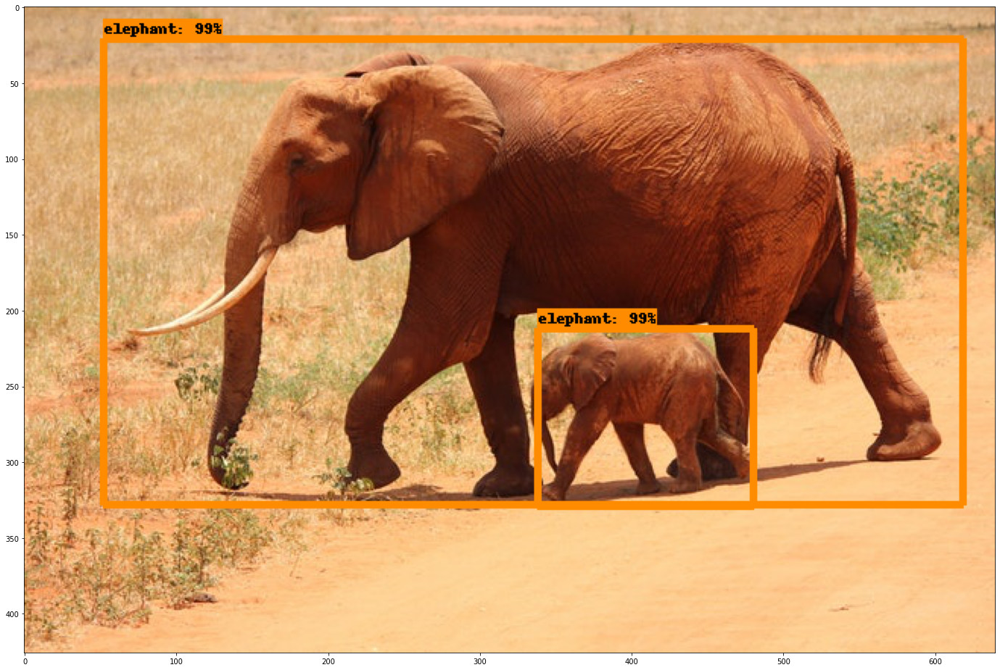

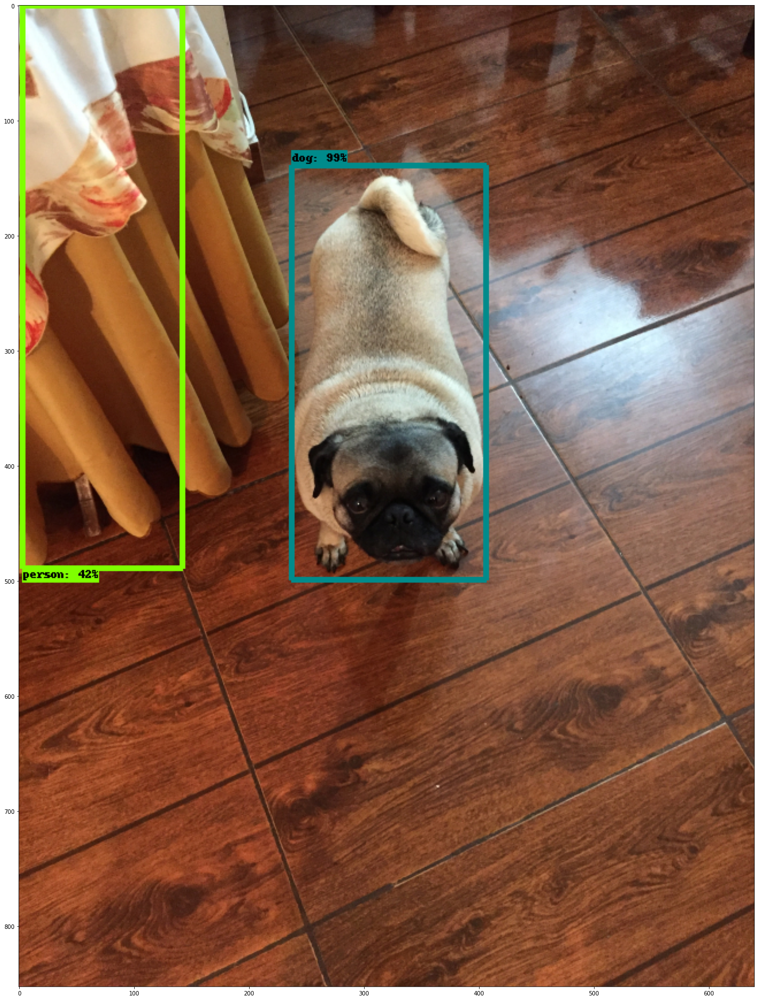

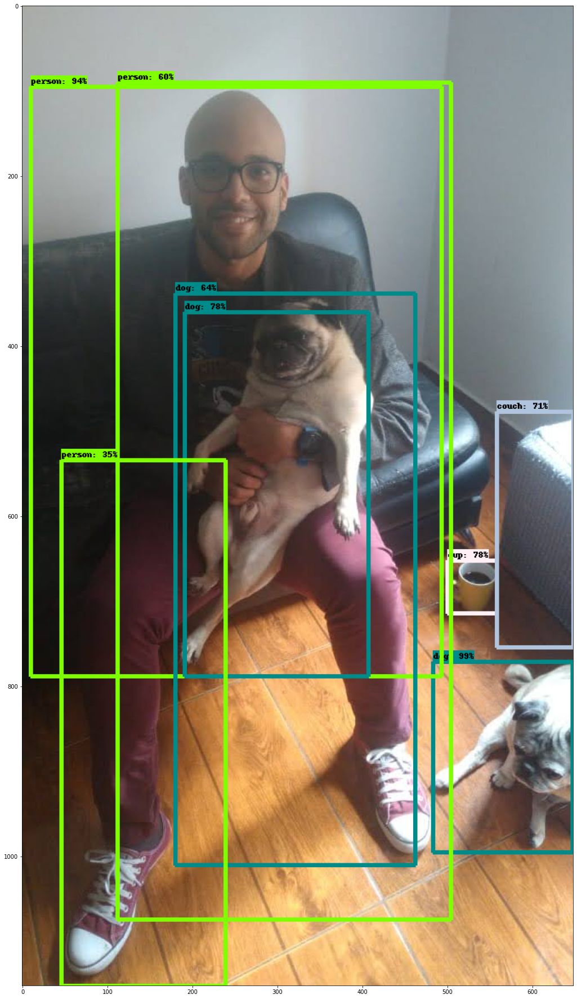

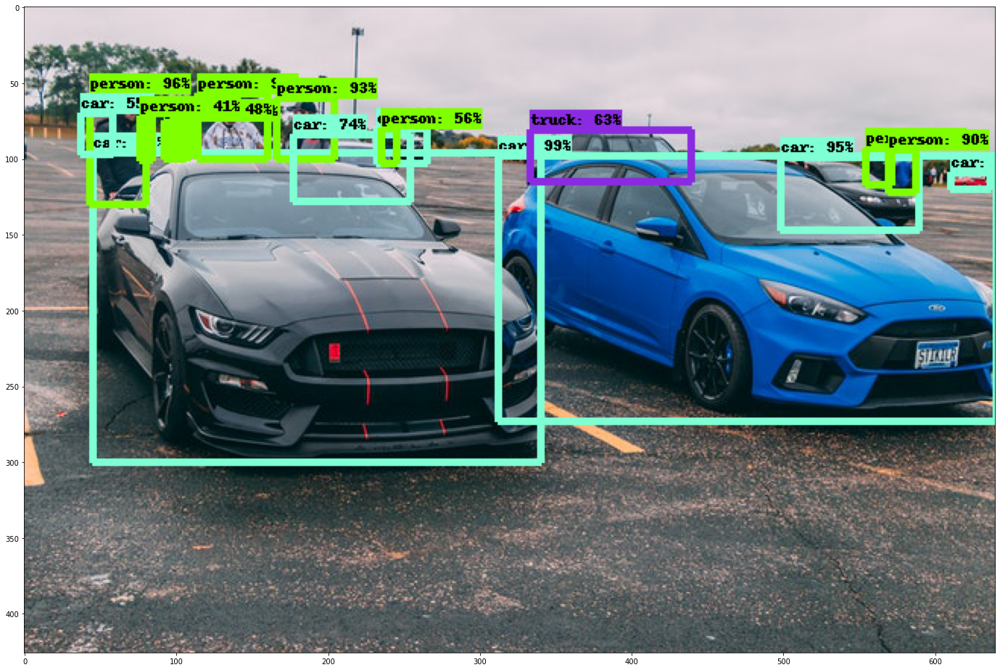

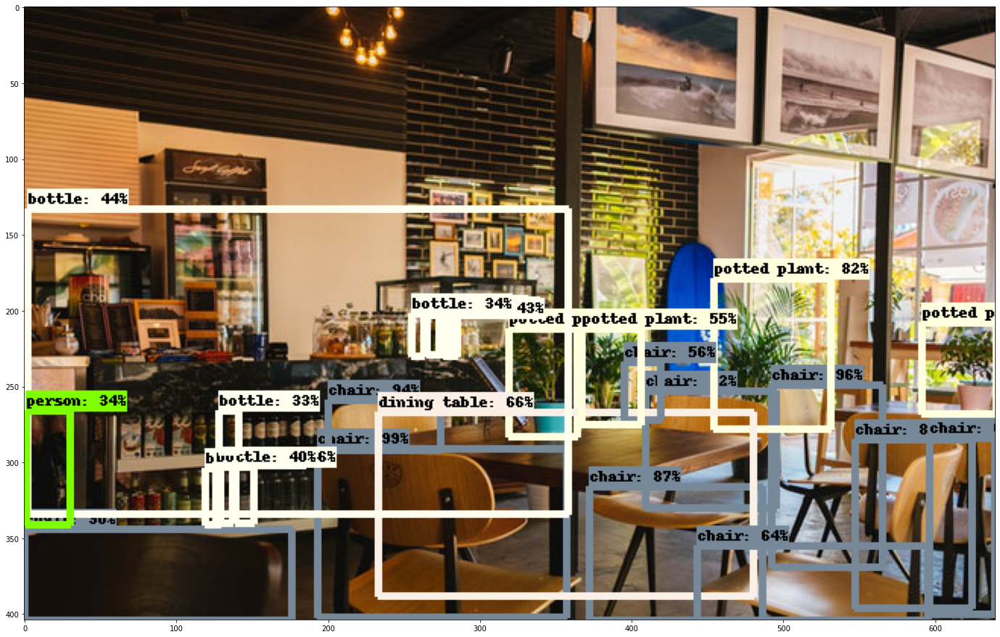

In [8]:
test_images_paths = glob.glob("test_images/*")
for image_path in test_images_paths:
  get_and_save_predictions(model, image_path)